In [54]:
import random
from random import sample
import pandas as pd
import pickle
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D 

In [16]:
path_risorse = "../bert_features/"

Distanza: 5
[0.11935987 0.08425588]


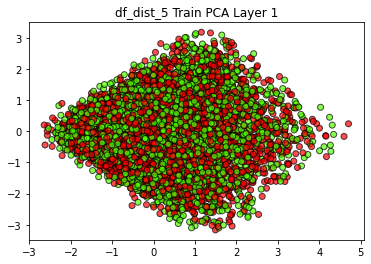

[0.11562245 0.08214348]


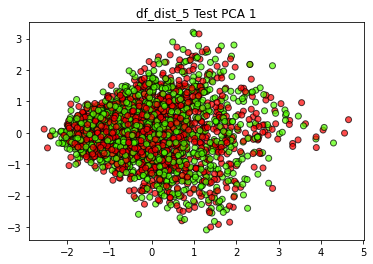

[0.14484838 0.10155363]


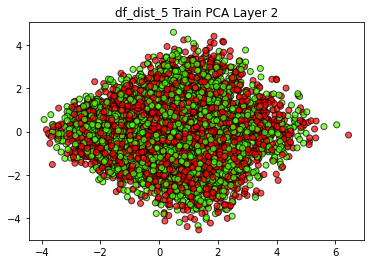

[0.13913223 0.09788405]


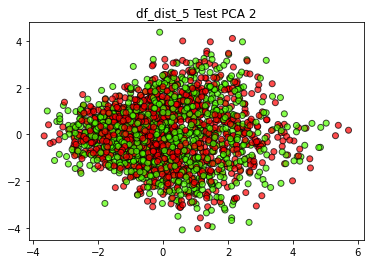

[0.13737986 0.09825675]


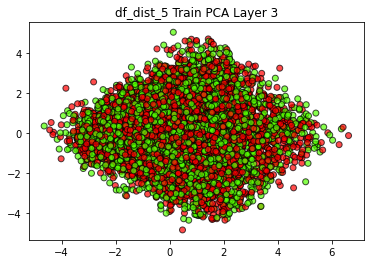

[0.13331403 0.09610735]


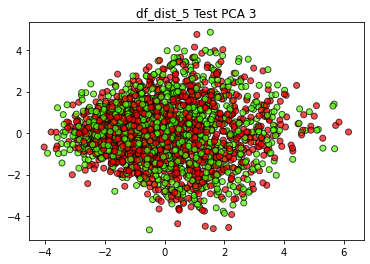

[0.14302369 0.10357333]


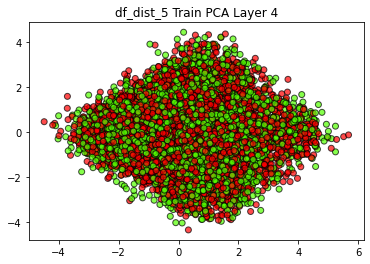

[0.13987916 0.10114328]


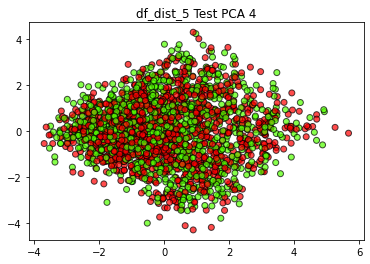

[0.1306946  0.09525239]


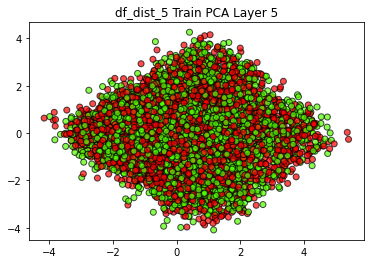

[0.12649658 0.09381426]


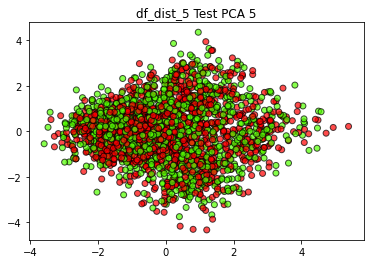

[0.15308297 0.11389757]


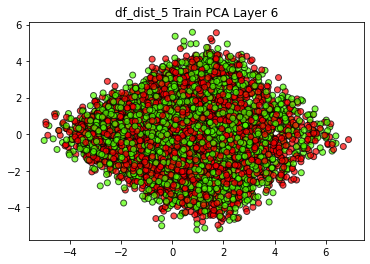

[0.14820077 0.10919351]


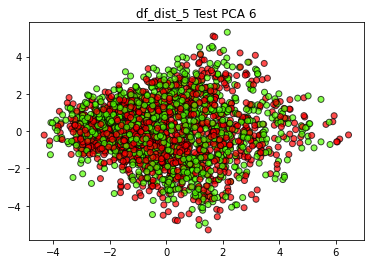

[0.16088431 0.11996779]


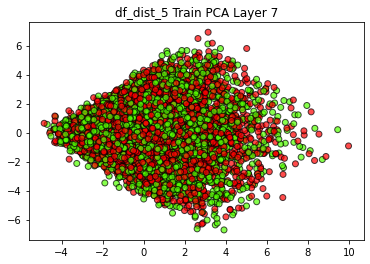

[0.15501968 0.11455666]


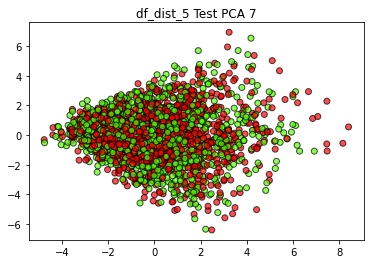

[0.16869337 0.12680623]


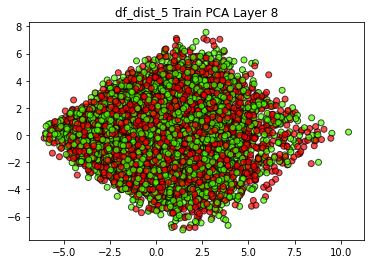

[0.16623382 0.12058852]


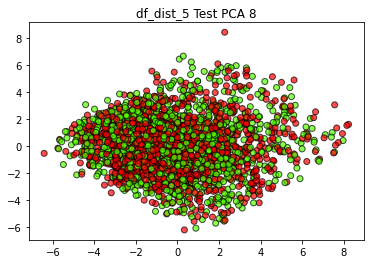

[0.15478429 0.13117672]


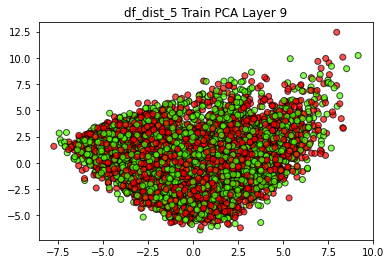

[0.15474298 0.13175092]


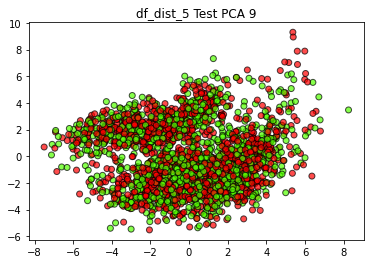

[0.15947399 0.13258041]


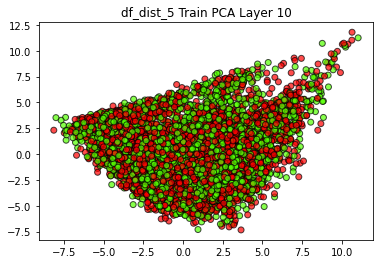

[0.15674914 0.13361387]


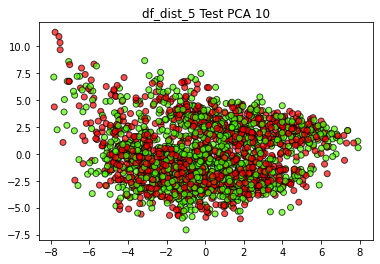

[0.23254917 0.20158555]


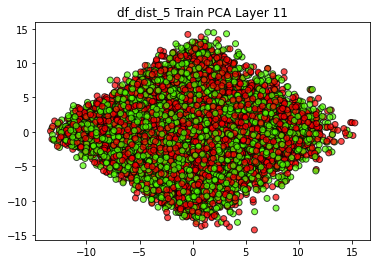

[0.23584043 0.2031137 ]


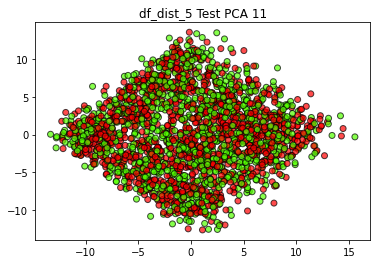

[0.23298854 0.2070051 ]


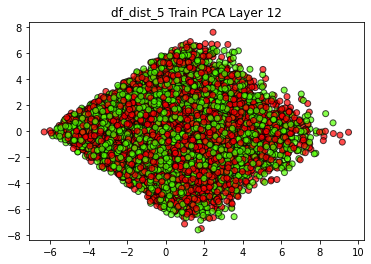

[0.23719094 0.20261197]


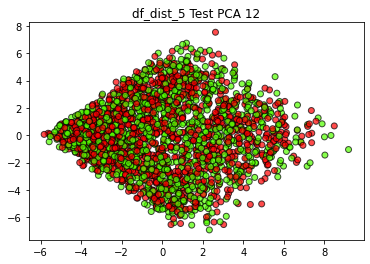


Distanza: 10
[0.11638812 0.08429471]


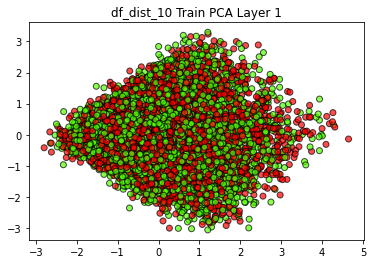

[0.11037129 0.09058934]


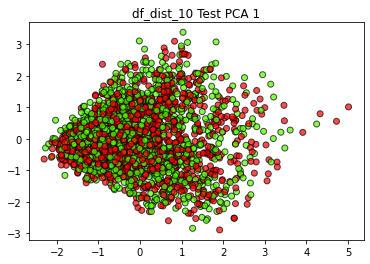

[0.14056283 0.1006593 ]


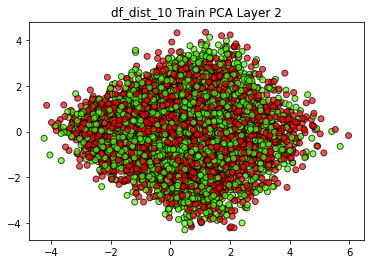

[0.13508436 0.11024869]


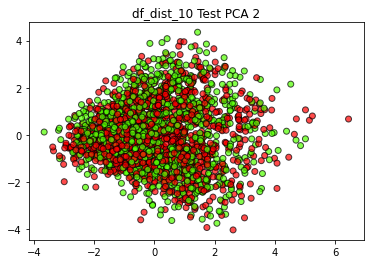

[0.13331266 0.09824925]


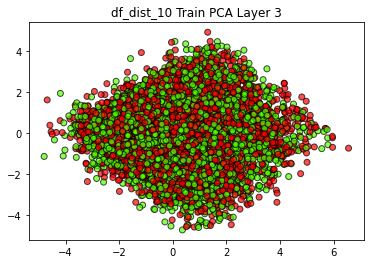

[0.12674128 0.10427105]


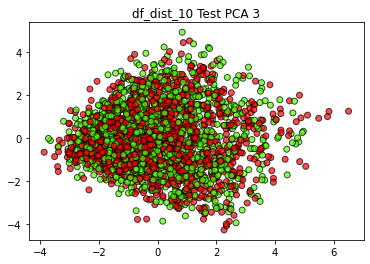

[0.14114639 0.10372077]


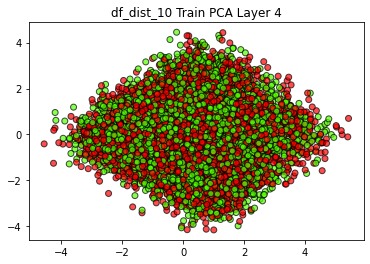

[0.13408798 0.10983959]


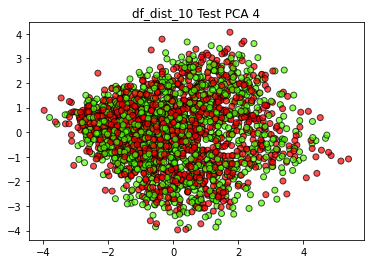

[0.12869067 0.0951249 ]


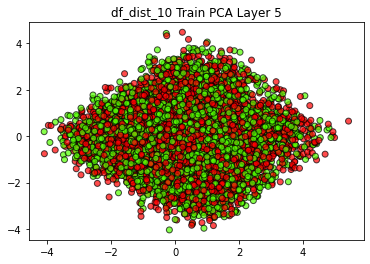

[0.12230047 0.09990578]


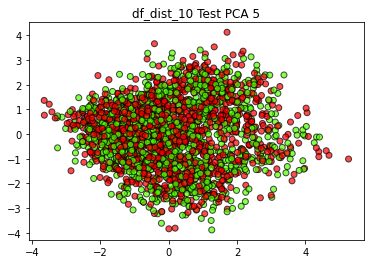

[0.15006424 0.11275892]


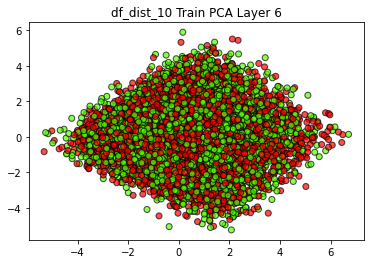

[0.14360873 0.11692792]


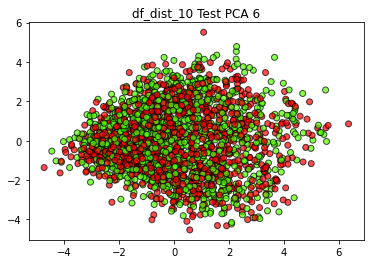

[0.15625029 0.11860316]


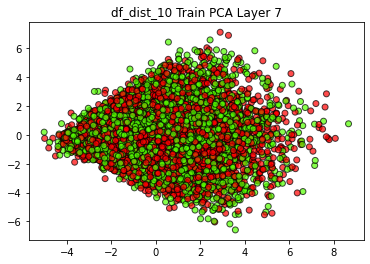

[0.14847753 0.12322849]


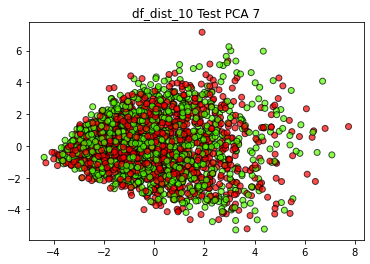

[0.16444602 0.12581066]


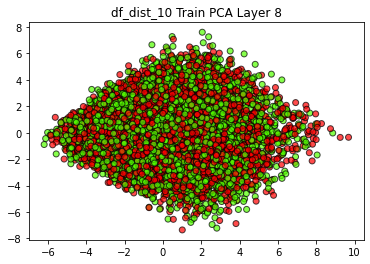

[0.15725108 0.13088266]


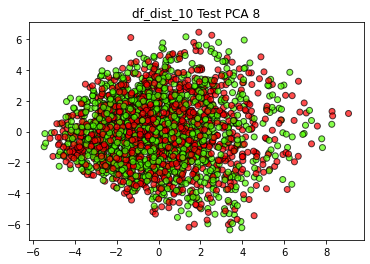

[0.15151098 0.12872209]


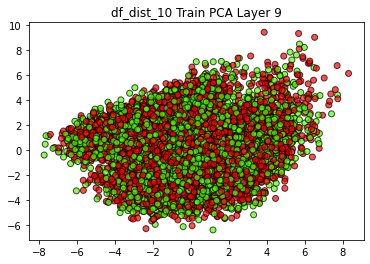

[0.14652886 0.13466819]


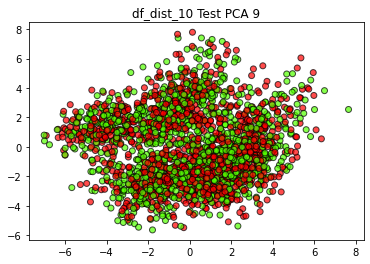

[0.15447    0.13045178]


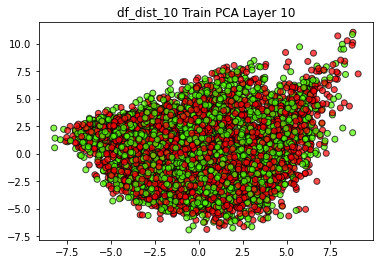

[0.14955853 0.13617931]


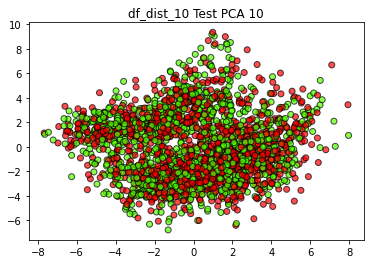

[0.22801537 0.20406294]


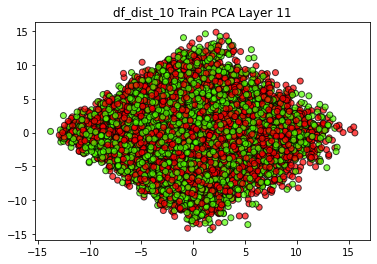

[0.22951718 0.20966001]


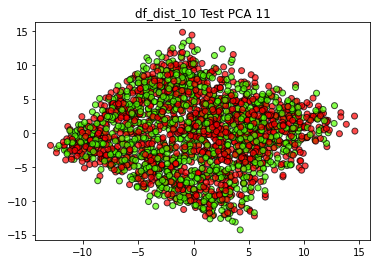

[0.22679981 0.21055104]


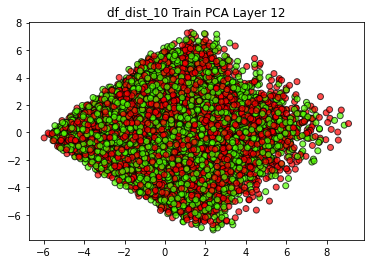

[0.22664702 0.20902271]


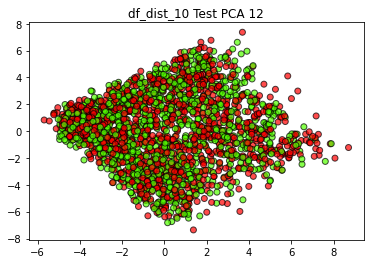


Distanza: 20
[0.11783599 0.08600745]


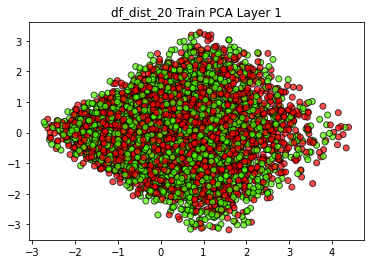

[0.1132454  0.08666514]


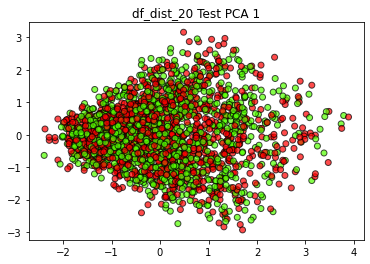

[0.14283802 0.10311105]


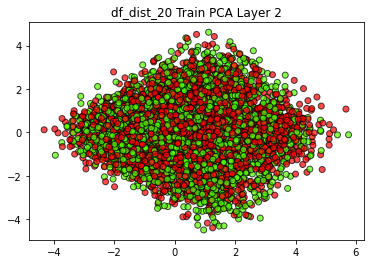

[0.13909934 0.10473423]


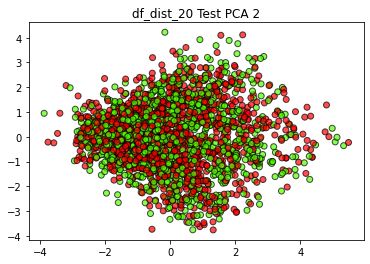

[0.13586331 0.09985664]


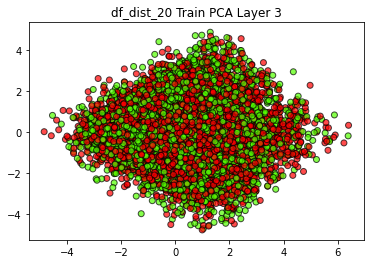

[0.1314575 0.1004607]


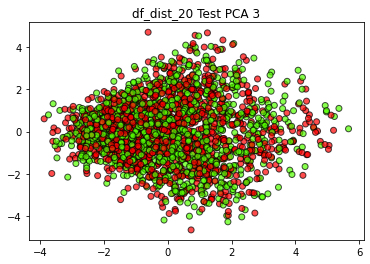

[0.14187579 0.10507806]


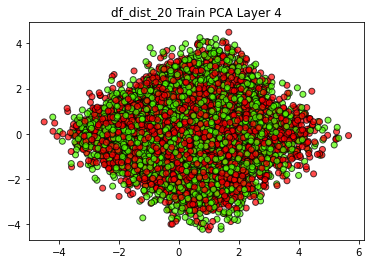

[0.13917811 0.1068022 ]


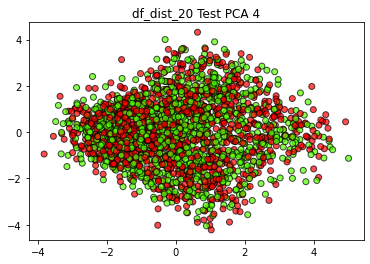

[0.1290121  0.09614839]


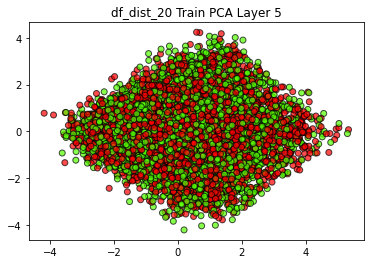

[0.12720985 0.09930425]


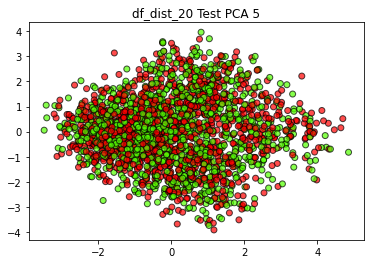

[0.15163855 0.11328365]


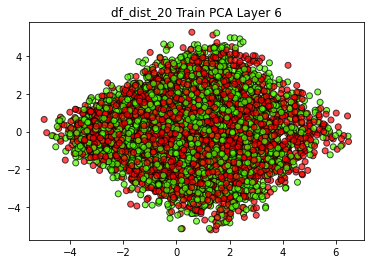

[0.14756087 0.11770675]


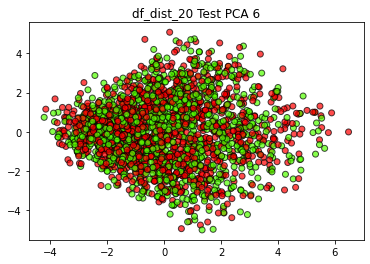

[0.15761393 0.11912797]


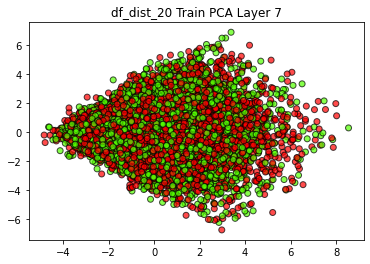

[0.155926   0.12250917]


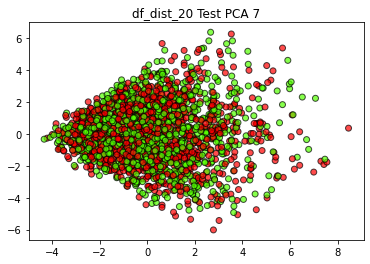

[0.16616803 0.12735498]


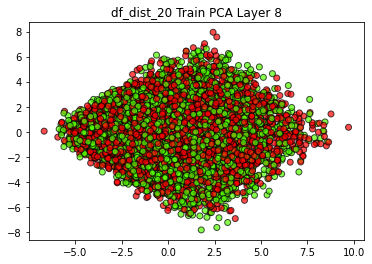

[0.16358121 0.12783074]


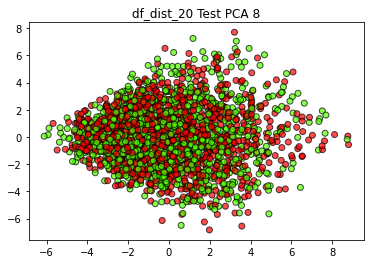

[0.15330221 0.12906879]


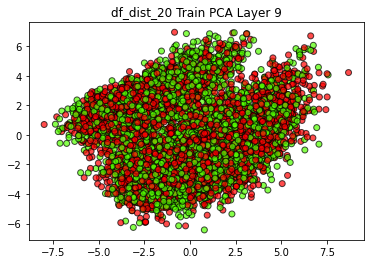

[0.15128389 0.13579928]


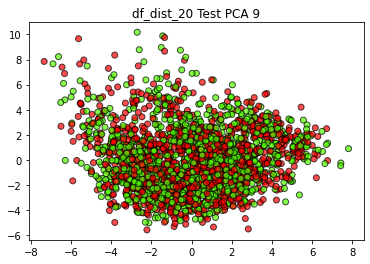

[0.15716233 0.13053536]


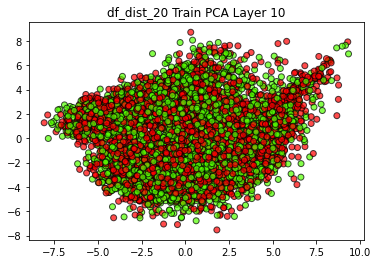

[0.15600534 0.13690377]


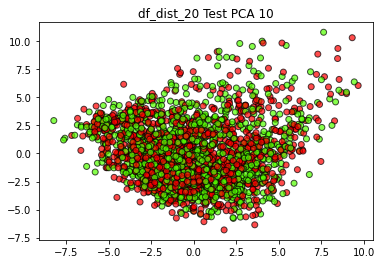

[0.23278311 0.20379546]


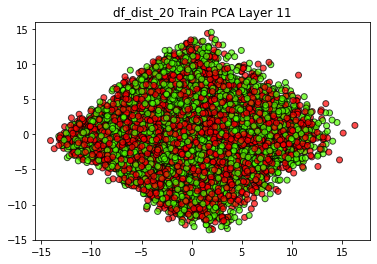

[0.2271181  0.20039931]


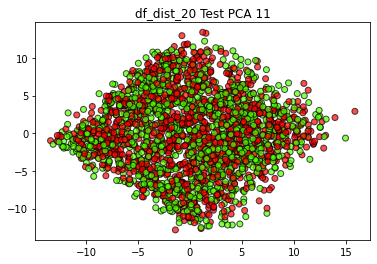

[0.23064545 0.20822841]


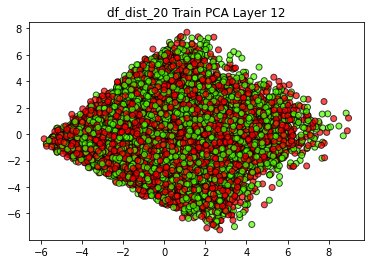

[0.22984858 0.2084977 ]


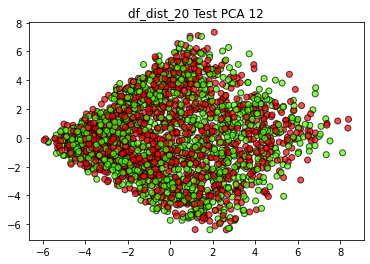


Distanza: 30
[0.11646702 0.0862275 ]


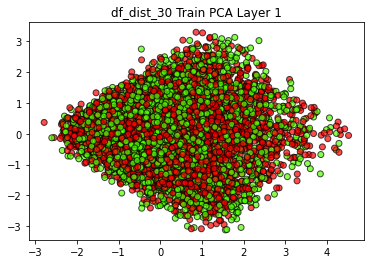

[0.11661147 0.08834768]


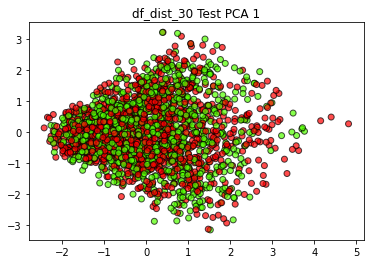

[0.14070551 0.10444036]


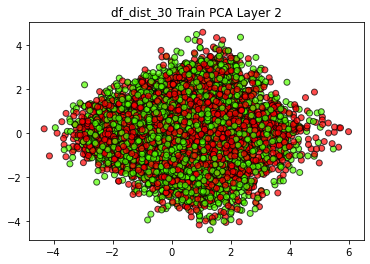

[0.14281121 0.10697952]


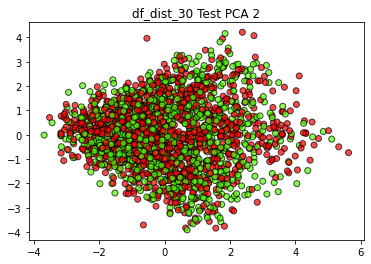

[0.13267332 0.10150122]


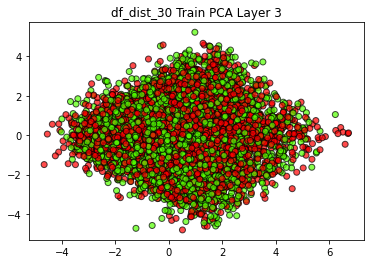

[0.13450111 0.10392024]


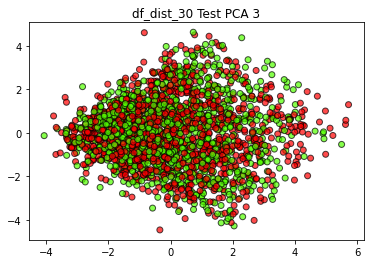

[0.13799312 0.10717073]


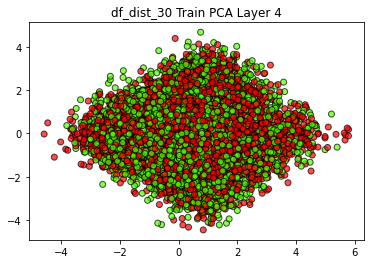

[0.13964151 0.10941382]


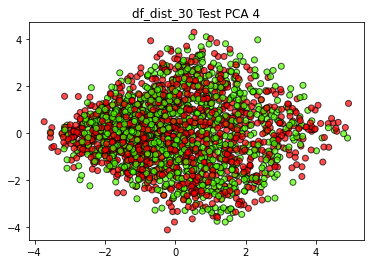

[0.1257851  0.09814909]


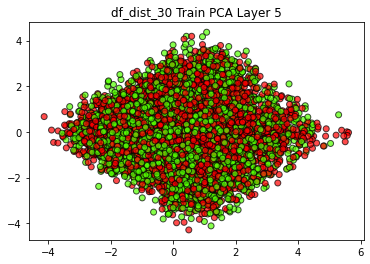

[0.12845807 0.10039793]


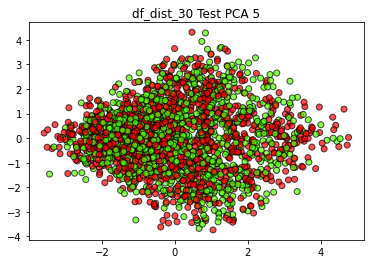

[0.14741752 0.11513064]


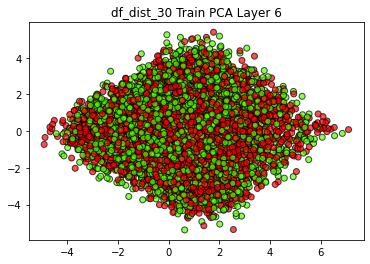

[0.14828309 0.11693888]


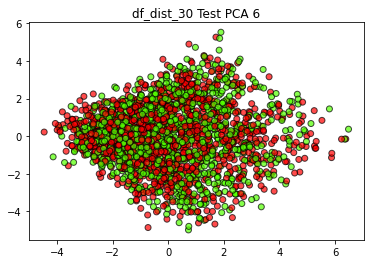

[0.15409727 0.12089542]


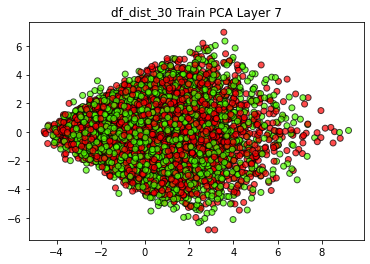

[0.15529364 0.12240218]


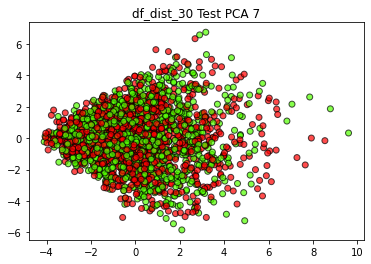

[0.16239667 0.12767319]


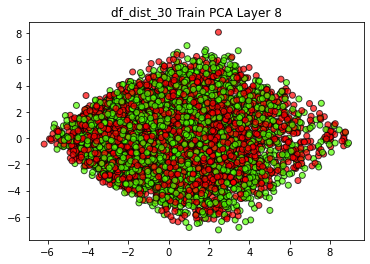

[0.16229035 0.12970136]


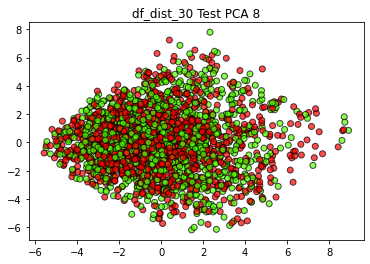

[0.14899241 0.13117377]


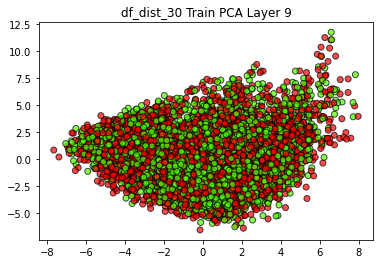

[0.14974671 0.13084462]


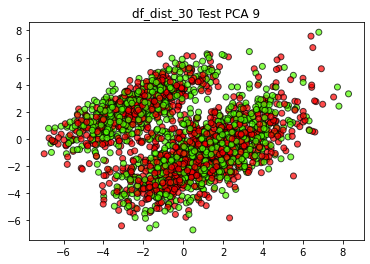

[0.15347167 0.13347005]


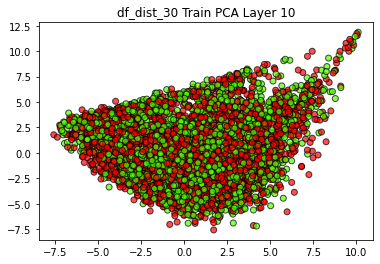

[0.15582925 0.13219065]


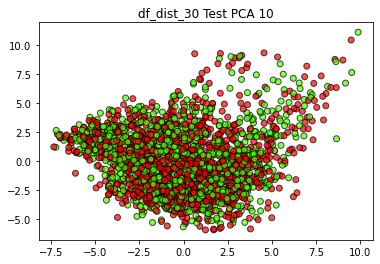

[0.22841261 0.20565207]


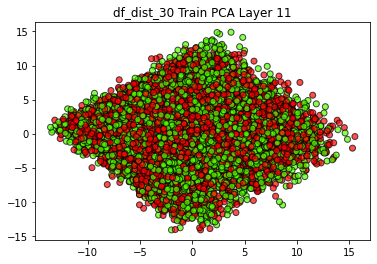

[0.23071177 0.20450782]


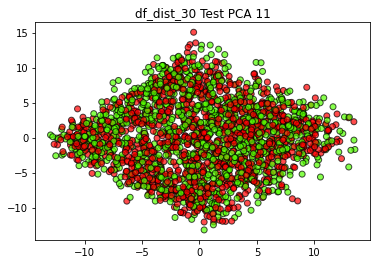

[0.23029564 0.21013279]


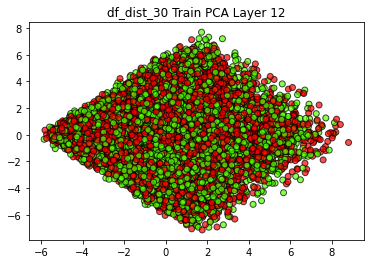

[0.23038385 0.20956994]


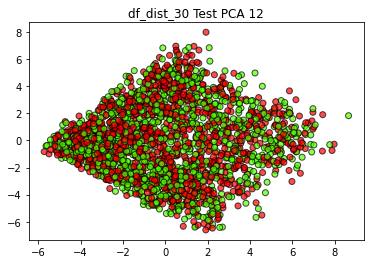

In [73]:
for dist in ['5', '10', '20', '30']:
    print("Distanza: {}".format(dist))
    training_to_read = open(path_risorse + "df_dist_{}_training_bert_features_for_layers.pickle".format(dist), "rb")
    test_to_read = open(path_risorse + "df_dist_{}_test_bert_features_for_layers.pickle".format(dist), "rb")

    df_training_bert_features_for_layers = pickle.load(training_to_read)

    df_test_bert_features_for_layers = pickle.load(test_to_read)

    df_name = "df_dist_{}".format(dist)

    for layer in list(range(1, 13)):

        #in ogni chiave (livello) ho id, features e classe di training e test

        #creo training e test con le features (vettori di BERT) per ogni specifico livello
        X_train = np.array([i[1] for i in df_training_bert_features_for_layers["{}_training".format(df_name)]["Layer_{}".format(layer)]])
        y_train = np.array([i[2] for i in df_training_bert_features_for_layers["{}_training".format(df_name)]["Layer_{}".format(layer)]])

        X_test = np.array([i[1] for i in df_test_bert_features_for_layers["{}_test".format(df_name)]["Layer_{}".format(layer)]])
        y_test = np.array([i[2] for i in df_test_bert_features_for_layers["{}_test".format(df_name)]["Layer_{}".format(layer)]])

        pca_train = PCA(n_components=2)
        pca_train.fit(X_train)
        X_pca_train = pca_train.transform(X_train)
        print(pca_train.explained_variance_ratio_)

        plt.scatter(X_pca_train[:, 0], X_pca_train[:, 1], \
                    c=y_train, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
        plt.title("df_dist_{} Train PCA Layer {}".format(dist, layer))
        plt.show()

        pca_test = PCA(n_components=2)
        pca_test.fit(X_test)
        X_pca_test = pca_test.transform(X_test)
        print(pca_test.explained_variance_ratio_)

        plt.scatter(X_pca_test[:, 0], X_pca_test[:, 1], \
                    c=y_test, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
        plt.title("df_dist_{} Test PCA {}".format(dist, layer))
        plt.show()
        
    print()